In [1]:
%load_ext autoreload
%autoreload 2

In [2]:

from argparse import Namespace
import torch
from train_pixart_layoutcontrolnet_hf_mix import load_pretrained, load_data, masktensor_to_colorimage, make_image_grid
# from train_pixart_layoutcontrolnet_hf3 import load_pretrained, load_data, masktensor_to_colorimage, make_image_grid
import json
from pathlib import Path
from torchvision import transforms
from torchvision.transforms.functional import to_tensor, to_pil_image
import pickle
from PIL import Image
import random


/USERSPACE/lukovdg1/venvs/sd3/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:

# DEFAULTPATH = "/USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_experiments_v2/pixart_coco_layoutcontrolnet2_attnctrl_noemb_noglobal"
# DEFAULTPATH = "/USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_experiments_v2/pixart_coco_layoutcontrolnet2_bbox_attnctrl_noattnemb_noglobal"
# DEFAULTPATH = "/USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_experiments_v2/pixart_coco_layoutcontrolnet3_bboxormask_attnmask"

# BBOX with learnable attention mix for text
# DEFAULTPATH = "/USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_experiments_v2/pixart_coco_layoutcontrolnet3_bbox"

# just BBOX (no text mechanism)
# DEFAULTPATH = "/USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_experiments_v2/pixart_coco_layoutcontrolnet3_bbox_notext"

# just BBOX/MASK (no text mechanism)
DEFAULTPATH = "/USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_experiments_v2/pixart_coco_layoutcontrolnet_mix_bboxmask_noattnctrl"

# just BBOX/MASK but trained with attention masking everywhere
# DEFAULTPATH = "/USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_experiments_v2/pixart_coco_layoutcontrolnet_mix_bboxmask_attnmaskboth"
DEFAULTDEVICE = 2

In [ ]:
expdir, device = DEFAULTPATH, DEFAULTDEVICE

override_args = {
    "mask_attention_control": True,
    "mask_attention_backbone": True,
    "no_masked_attention": False,
    "no_token_use_all": True,
}
# override_args = None

device = torch.device("cuda", device)
# device = torch.device("cpu")
# pipe, tokenizer, _, args = load_pretrained(Path(expdir), device=device, load_saved_state_dict=False)

pipe, tokenizer, _, args = load_pretrained(Path(expdir), device=device, _override_args=override_args)

print(json.dumps(args.__dict__, indent=4))

print(pipe.device)
pipe.to(device)
print(pipe.transformer.device)

In [ ]:
ds, dl = load_data(args, tokenizer, split="val")

seed = 42
maxex = 10
device = pipe.device


generator = torch.Generator(device=device)
if seed is not None:
    generator = generator.manual_seed(seed)

In [ ]:
NUMIMG_PER_PROMPT = 3

cond_images = []
images = []
captions = []


i = 0
while i < maxex:
    example = ds[i]
    images.append([])
    for _ in range(NUMIMG_PER_PROMPT):
        images[-1].append(
            pipe(prompt=example["captions"][0], obj_prompts=example["seg_captions"], obj_masks=example["cond_image"][None].to(device), 
                    num_inference_steps=20, generator=generator, height=512, width=512).images[0])
    # cond_images.append(transforms.ToPILImage()(masktensor_to_colorimage(example["cond_image"])))
    sumimg = example["cond_image"].float().sum(0, keepdims=True)
    cond_images.append(transforms.ToPILImage()( sumimg / sumimg.max()))
    captions.append(example["captions"][0])
    print(i, captions[-1])
    print([x for x in example["seg_captions"] if x is not None])
    display(make_image_grid([cond_images[-1]] + images[-1], 1, 1 + NUMIMG_PER_PROMPT))
    i += 1
    if i >= maxex:
        break

In [13]:

# DEFAULTPATH = "/USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_experiments_v2/pixart_coco_layoutcontrolnet2_attnctrl_noemb_noglobal"
# DEFAULTPATH = "/USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_experiments_v2/pixart_coco_layoutcontrolnet2_bbox_attnctrl_noattnemb_noglobal"
# DEFAULTPATH = "/USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_experiments_v2/pixart_coco_layoutcontrolnet3_bboxormask_attnmask"

# BBOX with learnable attention mix for text
# DEFAULTPATH = "/USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_experiments_v2/pixart_coco_layoutcontrolnet3_bbox"

# just BBOX (no text mechanism)
# DEFAULTPATH = "/USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_experiments_v2/pixart_coco_layoutcontrolnet3_bbox_notext"

# just BBOX/MASK (no text mechanism)
# DEFAULTPATH = "/USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_experiments_v2/pixart_coco_layoutcontrolnet_mix_bboxmask_noattnctrl"

# just BBOX/MASK but trained with attention masking everywhere
DEFAULTPATH = "/USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_experiments_v2/pixart_coco_layoutcontrolnet_mix_bboxmask_attnmaskboth"
# DEFAULTPATH = "/USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_experiments_v2/pixart_coco_layoutcontrolnet_mix_bboxmask_attnmixboth"
DEFAULTDEVICE = 2

In [ ]:
expdir, device = DEFAULTPATH, DEFAULTDEVICE

override_args = None

device = torch.device("cuda", device)
# device = torch.device("cpu")
# pipe, tokenizer, _, args = load_pretrained(Path(expdir), device=device, load_saved_state_dict=False)

pipe, tokenizer, _, args = load_pretrained(Path(expdir), device=device, _override_args=override_args)

print(json.dumps(args.__dict__, indent=4))

print(pipe.device)
pipe.to(device)
print(pipe.transformer.device)

In [ ]:
ds, dl = load_data(args, tokenizer, split="val")

seed = 42
maxex = 10
device = pipe.device


generator = torch.Generator(device=device)
if seed is not None:
    generator = generator.manual_seed(seed)

In [ ]:
NUMIMG_PER_PROMPT = 3

cond_images = []
images = []
captions = []


i = 0
while i < maxex:
    example = ds[i]
    images.append([])
    for _ in range(NUMIMG_PER_PROMPT):
        images[-1].append(
            pipe(prompt=example["captions"][0], obj_prompts=example["seg_captions"], obj_masks=example["cond_image"][None].to(device), 
                    num_inference_steps=20, generator=generator, height=512, width=512).images[0])
    # cond_images.append(transforms.ToPILImage()(masktensor_to_colorimage(example["cond_image"])))
    sumimg = example["cond_image"].float().sum(0, keepdims=True)
    cond_images.append(transforms.ToPILImage()( sumimg / sumimg.max()))
    captions.append(example["captions"][0])
    print(i, captions[-1])
    print([x for x in example["seg_captions"] if x is not None])
    display(make_image_grid([cond_images[-1]] + images[-1], 1, 1 + NUMIMG_PER_PROMPT))
    i += 1
    if i >= maxex:
        break

In [ ]:
for i in range(len(images)):
    print(i)
    print(captions[i])
    display(make_image_grid(cond_images[i:i+1] + images[i:i+1], 1, 2))

In [ ]:
# challenging cases with three balls
print(args.use_bbox)

In [ ]:
import random
import re

examples = pickle.load(open("/USERSPACE/lukovdg1/controlnet11/evaldata/extradev_importless.pkl", "rb"))
x = examples[0]
x

caption = x["captions"][0]
segten = (transforms.ToTensor()(x["seg_data"]) * 255).to(torch.long)
segten = segten[0] + segten[1] * 256 + segten[2] * 256**2
print(segten.unique())

USEBBOX = True


objmasks = torch.zeros((21,) + segten.shape).to(segten.device, torch.bool)
objlayerids = list(range(len(objmasks)))
random.shuffle(objlayerids)
captions = [None for _ in range(len(objlayerids))]
for colorid in segten.unique():
    # get mask and store in variable
    mask = (segten == colorid).float()
    if USEBBOX:   # convert mask to bbox
        topleft = mask.nonzero().min(0)[0]
        bottomright = mask.nonzero().max(0)[0]
        mask.fill_(0)
        mask[topleft[0]:bottomright[0], topleft[1]:bottomright[1]] = 0.5
    layerid = objlayerids.pop(0)
    objmasks[layerid] = mask
    # get description from global dense prompt and store it
    found = re.findall(r"\{([^:]+):" + str(colorid.item()) + "\}", caption)
    assert(len(found) == 1)
    captions[layerid] = found[0]
    # print(found)
    # display(transforms.ToPILImage()(mask.to(torch.float)))
    
print(captions)
print(objmasks.shape)
print(objmasks.sum(-1).sum(-1))
    

In [ ]:
imgs = []
for _ in range(5):
    img = pipe(prompt="a photo of", obj_prompts=captions, obj_masks=objmasks[None].to(device, torch.long), 
                    num_inference_steps=20, generator=generator, height=512, width=512).images[0]
    imgs.append(img)
display(make_image_grid(imgs, 1, 5))

In [ ]:
imgs = []
for _ in range(5):
    img = pipe(prompt="a photo of", obj_prompts=captions, obj_masks=objmasks[None].to(device, torch.long), 
                    num_inference_steps=20, generator=generator, height=512, width=512).images[0]
    imgs.append(img)
display(make_image_grid(imgs, 1, 5))

In [ ]:
imgs = []
for _ in range(5):
    img = pipe(prompt="a photo of", obj_prompts=captions, obj_masks=objmasks[None].to(device, torch.long), 
                    num_inference_steps=20, generator=generator, height=512, width=512).images[0]
    imgs.append(img)
display(make_image_grid(imgs, 1, 5))

In [ ]:
imgs = []
for _ in range(5):
    img = pipe(prompt="a photo of", obj_prompts=captions, obj_masks=objmasks[None].to(device, torch.long), 
                    num_inference_steps=20, generator=generator, height=512, width=512).images[0]
    imgs.append(img)
display(make_image_grid(imgs, 1, 5))

In [1]:
## EVALUATING VARIABLE PRECISION

In [3]:

DEFAULTPATH = "/USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_experiments_v2/pixart_coco_layoutcontrolnet3_varprec_noattnctrl"
DEFAULTDEVICE = 2

In [4]:
expdir, device = DEFAULTPATH, DEFAULTDEVICE

override_args = {
    "mask_attention_control": True,
    "mask_attention_backbone": True,
    "no_masked_attention": False,
    "no_token_use_all": True,
}
# override_args = None

device = torch.device("cuda", device)
# device = torch.device("cpu")
# pipe, tokenizer, _, args = load_pretrained(Path(expdir), device=device, load_saved_state_dict=False)

pipe, tokenizer, _, args = load_pretrained(Path(expdir), device=device, _override_args=override_args)

print(json.dumps(args.__dict__, indent=4))

print(pipe.device)
pipe.to(device)
print(pipe.transformer.device)

You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
Loading checkpoint shards: 100%|██████████| 2/2 [00:03<00:00,  2.00s/it]


torch.Size([1, 512, 64, 64])


/USERSPACE/lukovdg1/pixart-sigma/train_scripts/train_pixart_layoutcontrolnet_hf_mix.py:704: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  controlencoder.load_state_dict(torc

Loading from:  /USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_experiments_v2/pixart_coco_layoutcontrolnet3_varprec_noattnctrl/saved-45000


/USERSPACE/lukovdg1/pixart-sigma/train_scripts/train_pixart_layoutcontrolnet_hf_mix.py:738: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sd = torch.load(savedpaths[0] / "co

loaded pipeline components, loading pipeline


Loading pipeline components...: 100%|██████████| 5/5 [00:00<00:00,  5.31it/s]


{
    "startfrom": null,
    "num_control_layers": 14,
    "control_encoder": "/USERSPACE/lukovdg1/pixart-sigma/train_scripts/control_ae_output_v2_controlnet/encoder.pth",
    "control_encoder2": null,
    "use_controlnet": true,
    "cpu_only": false,
    "bbox_mix": 0.0,
    "varprec_mix": 0.8,
    "point_mix": 0.0,
    "no_masked_attention": false,
    "mask_attention_backbone": true,
    "mask_attention_control": true,
    "use_attention_mix": false,
    "use_attention_mix_light": false,
    "omit_global_caption": true,
    "use_attention_embeddings": false,
    "use_identlin": false,
    "use_controllora": false,
    "lora_rank": null,
    "use_adapters": false,
    "pretrained_model_name_or_path": "PixArt-alpha/PixArt-Sigma-XL-2-512-MS",
    "dataset_name": null,
    "dataset_config_name": null,
    "train_data_dir": "/USERSPACE/lukovdg1/coco2017",
    "image_column": "image",
    "caption_column": "text",
    "validation_prompt": "a stylized portrait drawing the style of thisnew

In [6]:
ds, dl = load_data(args, tokenizer, split="val")

seed = 42
maxex = 10
device = pipe.device


generator = torch.Generator(device=device)
if seed is not None:
    generator = generator.manual_seed(seed)

loading captions
loading instances
Creating examples


100%|██████████| 5000/5000 [00:00<00:00, 363571.30it/s]

Size stats:
{384: 1937, 448: 1792, 512: 343}
Retained examples: 3342
Too many regions: 121
Too few regions: 609
Too small: 928


In [19]:
NUMIMG_PER_PROMPT = 3

cond_images = []
images = []
captions = []


i = 0
while i < maxex:
    example = ds[i]
    images.append([])
    # print(example["seg_captions"])
    # print(example["captions"])
    # break
    for _ in range(NUMIMG_PER_PROMPT):
        images[-1].append(
            pipe(prompt=example["captions"][0], obj_prompts=example["seg_captions"], obj_masks=example["cond_image"][None].to(device), 
                    num_inference_steps=20, generator=generator, height=512, width=512).images[0])
    # cond_images.append(transforms.ToPILImage()(masktensor_to_colorimage(example["cond_image"])))
    sumimg = example["cond_image"].float().sum(0, keepdims=True)
    cond_images.append(transforms.ToPILImage()( sumimg / sumimg.max()))
    captions.append(example["captions"][0])
    print(i, captions[-1])
    print([x for x in example["seg_captions"] if x is not None])
    display(make_image_grid([cond_images[-1]] + images[-1], 1, 1 + NUMIMG_PER_PROMPT))
    i += 1
    if i >= maxex:
        break

[None, None, 'a man with curly hair wearing a white apron and black pants.', 'a large, round, wooden bowl.', 'cup', 'black oven with red light.', 'old-fashioned wood-burning stove.', None, 'bottle', None, 'cup', 'black metal sink in a wooden cabinet.', None, None, None, None, 'bowl', None, None, 'white ceramic bowl with ridges.', 'wooden table with various food items and utensils on it.']
['A baker is working in the kitchen rolling dough.']


/USERSPACE/lukovdg1/pixart-sigma/testmasks/horse/horse_bbox.png


100%|██████████| 20/20 [00:06<00:00,  3.00it/s]


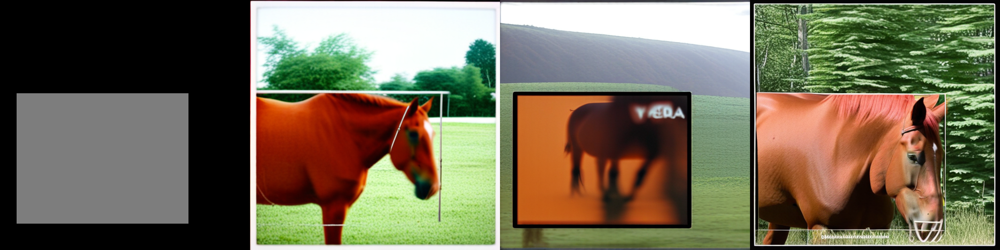

/USERSPACE/lukovdg1/pixart-sigma/testmasks/horse/horse_headdown.png


100%|██████████| 20/20 [00:06<00:00,  2.99it/s]


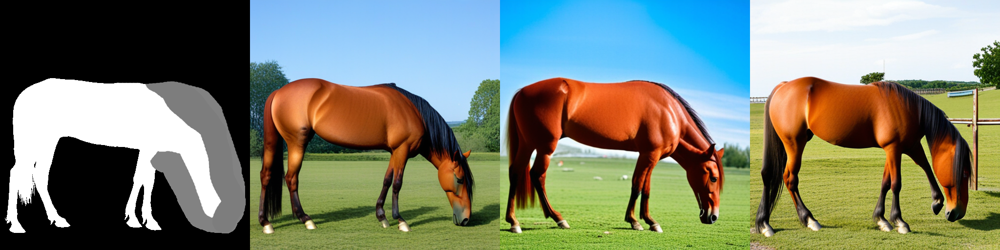

/USERSPACE/lukovdg1/pixart-sigma/testmasks/horse/horse_body.png


100%|██████████| 20/20 [00:06<00:00,  2.98it/s]


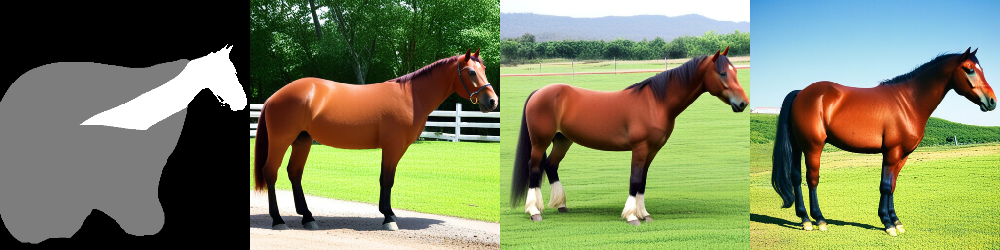

/USERSPACE/lukovdg1/pixart-sigma/testmasks/horse/horse_vague.png


100%|██████████| 20/20 [00:06<00:00,  2.98it/s]


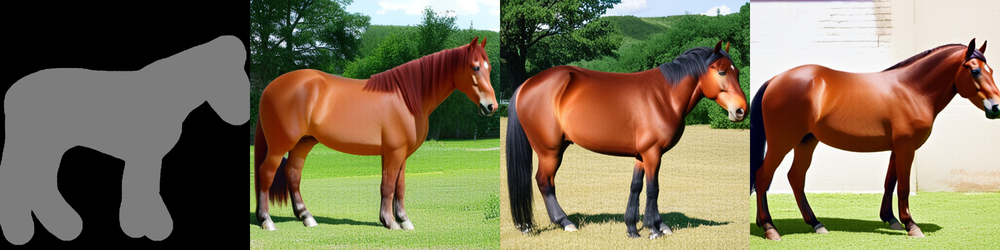

/USERSPACE/lukovdg1/pixart-sigma/testmasks/horse/horse_exact.png


100%|██████████| 20/20 [00:06<00:00,  2.98it/s]


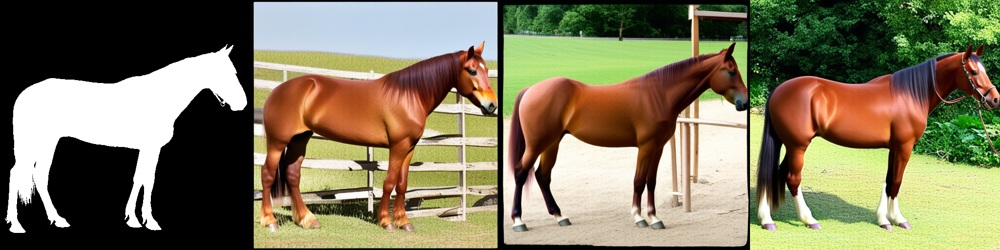

/USERSPACE/lukovdg1/pixart-sigma/testmasks/horse/horse_vaguepoints.png


100%|██████████| 20/20 [00:06<00:00,  2.98it/s]


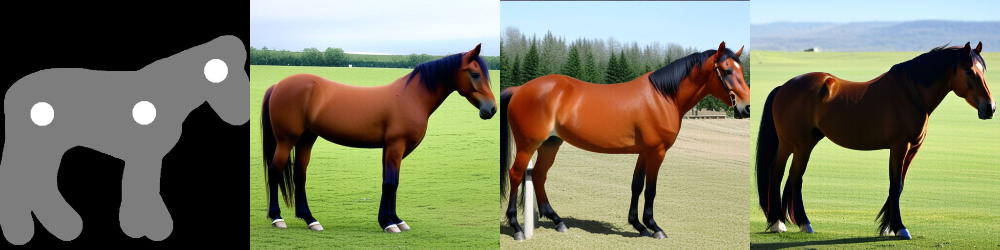

/USERSPACE/lukovdg1/pixart-sigma/testmasks/horse/horse_torso.png


100%|██████████| 20/20 [00:06<00:00,  2.98it/s]


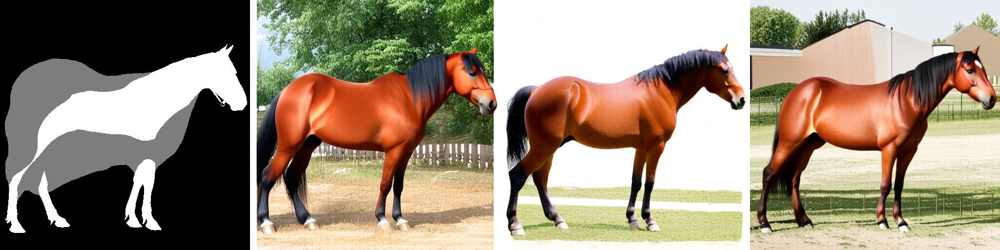

/USERSPACE/lukovdg1/pixart-sigma/testmasks/horse/horse_head.png


100%|██████████| 20/20 [00:06<00:00,  2.97it/s]


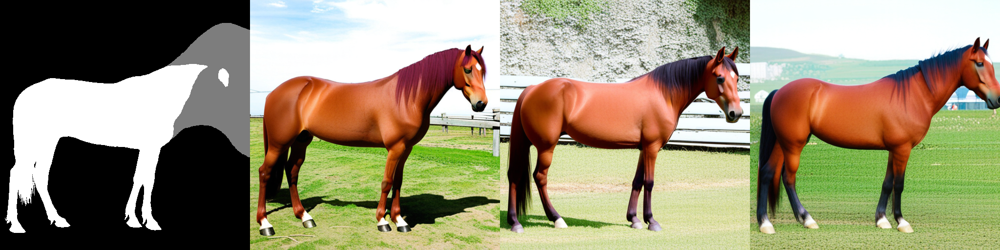

In [25]:
# HORSE EXAMPLE


NUMIMG_PER_PROMPT = 3
# NUMIMG_PER_PROMPT = 3

horsemasks = "/USERSPACE/lukovdg1/pixart-sigma/testmasks/horse/"
caption = "a brown horse"

filter = lambda x: True
# filter = lambda x: "bbox" in str(x)
# filter = lambda x: "headdown" in str(x)

for horsemask in Path(horsemasks).glob("*"):
    print(horsemask)
    if filter(horsemask):
        segten = to_tensor(Image.open(horsemask).convert("L"))[0]
        # print(segten.shape, segten.min(), segten.max())
        objmasks = torch.zeros((21,) + segten.shape).to(segten.device)
        objlayerids = list(range(len(objmasks)))
        random.shuffle(objlayerids)
        captions = [None for _ in range(len(objlayerids))]
        
        objmasks[objlayerids[0]] = segten
        captions[objlayerids[0]] = caption
        
        
        images = []
        
        for _ in range(NUMIMG_PER_PROMPT):
            images.append(
                pipe(prompt=caption, obj_prompts=captions, obj_masks=objmasks[None].to(device), 
                        num_inference_steps=20, generator=generator, height=512, width=512).images[0])
        
        sumimg = to_pil_image(segten)
        display(make_image_grid([sumimg] + images, 1, 1 + len(images)))
    
    
    